In [1]:
from sklearn.datasets import fetch_20newsgroups
import string
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.naive_bayes import MultinomialNB
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import matplotlib.pyplot as plt

In [2]:
newsgroups=fetch_20newsgroups() 
print(newsgroups.keys())

dict_keys(['data', 'filenames', 'target_names', 'target', 'DESCR'])


In [4]:
# Creating a list of stopwords
import nltk
nltk.download('stopwords')
stop_words = nltk.corpus.stopwords.words('english')
print((stop_words))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

[nltk_data] Downloading package stopwords to /home/nayan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
# Adding punctutations to list of stopwords

punctuations=list(string.punctuation)
for i in punctuations:
    stop_words.append(i)
stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [6]:
# Adding more stopwords downloaded from internet

more_stops=list(np.loadtxt("Desktop/stopwords.txt", dtype=str, delimiter=" "))
for i in more_stops:
    stop_words.append(i)
print(len(stop_words))
print(stop_words)

640
['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than

In [7]:
print(newsgroups.keys())

dict_keys(['data', 'filenames', 'target_names', 'target', 'DESCR'])


In [8]:
documents=newsgroups['data']
len(documents)

11314

In [9]:
target_class=newsgroups['target']
len(target_class)

11314

In [10]:
target_class_names=newsgroups['target_names']
target_class_names

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

In [11]:
nltk.download('punkt')
documents_modified=[word_tokenize(doc) for doc in documents]
documents_modified

[nltk_data] Downloading package punkt to /home/nayan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


[['From',
  ':',
  'lerxst',
  '@',
  'wam.umd.edu',
  '(',
  'where',
  "'s",
  'my',
  'thing',
  ')',
  'Subject',
  ':',
  'WHAT',
  'car',
  'is',
  'this',
  '!',
  '?',
  'Nntp-Posting-Host',
  ':',
  'rac3.wam.umd.edu',
  'Organization',
  ':',
  'University',
  'of',
  'Maryland',
  ',',
  'College',
  'Park',
  'Lines',
  ':',
  '15',
  'I',
  'was',
  'wondering',
  'if',
  'anyone',
  'out',
  'there',
  'could',
  'enlighten',
  'me',
  'on',
  'this',
  'car',
  'I',
  'saw',
  'the',
  'other',
  'day',
  '.',
  'It',
  'was',
  'a',
  '2-door',
  'sports',
  'car',
  ',',
  'looked',
  'to',
  'be',
  'from',
  'the',
  'late',
  '60s/',
  'early',
  '70s',
  '.',
  'It',
  'was',
  'called',
  'a',
  'Bricklin',
  '.',
  'The',
  'doors',
  'were',
  'really',
  'small',
  '.',
  'In',
  'addition',
  ',',
  'the',
  'front',
  'bumper',
  'was',
  'separate',
  'from',
  'the',
  'rest',
  'of',
  'the',
  'body',
  '.',
  'This',
  'is',
  'all',
  'I',
  'know',
  '

In [12]:
# Splitting into train and test data 

x_train,x_test,y_train,y_test=train_test_split(documents_modified,target_class,random_state=0)
x_train

[['From',
  ':',
  'backon',
  '@',
  'vms.huji.ac.il',
  'Subject',
  ':',
  'Re',
  ':',
  'Go',
  'Hezbollah',
  '!',
  '!',
  'Distribution',
  ':',
  'world',
  'Organization',
  ':',
  'The',
  'Hebrew',
  'University',
  'of',
  'Jerusalem',
  'Lines',
  ':',
  '23',
  'In',
  'article',
  '<',
  '1993Apr14.125813.21737',
  '@',
  'ncsu.edu',
  '>',
  ',',
  'hernlem',
  '@',
  'chess.ncsu.edu',
  '(',
  'Brad',
  'Hernlem',
  ')',
  'writes',
  ':',
  '>',
  '>',
  'Lebanese',
  'resistance',
  'forces',
  'detonated',
  'a',
  'bomb',
  'under',
  'an',
  'Israeli',
  'occupation',
  '>',
  'patrol',
  'in',
  'Lebanese',
  'territory',
  'two',
  'days',
  'ago',
  '.',
  'Three',
  'soldiers',
  'were',
  'killed',
  'and',
  '>',
  'two',
  'wounded',
  '.',
  'In',
  '``',
  'retaliation',
  "''",
  ',',
  'Israeli',
  'and',
  'Israeli-backed',
  'forces',
  'wounded',
  '>',
  '8',
  'civilians',
  'by',
  'bombarding',
  'several',
  'Lebanese',
  'villages',
  '.',
  '

In [13]:
# List containing all the important words that occured in the document

all_words=[]

for doc in x_train:
    for word in doc:
        if (word not in stop_words) and len(word)>2 and word[0]!="'"and word[0]!="." and word[0]!="_" and word[0]!="n't" and word[0]!="=":
            all_words.append(word)
all_words

['From',
 'backon',
 'vms.huji.ac.il',
 'Subject',
 'Hezbollah',
 'Distribution',
 'world',
 'Organization',
 'The',
 'Hebrew',
 'University',
 'Jerusalem',
 'Lines',
 'article',
 '1993Apr14.125813.21737',
 'ncsu.edu',
 'hernlem',
 'chess.ncsu.edu',
 'Brad',
 'Hernlem',
 'writes',
 'Lebanese',
 'resistance',
 'forces',
 'detonated',
 'bomb',
 'Israeli',
 'occupation',
 'patrol',
 'Lebanese',
 'territory',
 'days',
 'ago',
 'Three',
 'soldiers',
 'killed',
 'wounded',
 'retaliation',
 'Israeli',
 'Israeli-backed',
 'forces',
 'wounded',
 'civilians',
 'bombarding',
 'Lebanese',
 'villages',
 'Ironically',
 'Israeli',
 'government',
 'justifies',
 'occupation',
 'Lebanon',
 'claiming',
 'prevent',
 'bombardments',
 'Israeli',
 'villages',
 'Congratulations',
 'brave',
 'Lebanese',
 'resistance',
 'With',
 'Israeli',
 'son',
 'grave',
 'underlining',
 'moral',
 'bankruptcy',
 'Israel',
 'occupation',
 'drawing',
 'attention',
 'Israeli',
 'government',
 'policy',
 'reckless',
 'disregard'

In [14]:
len(all_words)

1259150

In [15]:
# Dictionary having keys as words and values as their frequencies occured in the document

words_dict={}
for word in all_words:
    if(word not in words_dict.keys()):
        words_dict[word]=1
    else:
        words_dict[word]=words_dict[word]+1

words_dict

{'From': 9060,
 'backon': 16,
 'vms.huji.ac.il': 14,
 'Subject': 8817,
 'Hezbollah': 51,
 'Distribution': 1913,
 'world': 1534,
 'Organization': 8203,
 'The': 11808,
 'Hebrew': 63,
 'University': 4087,
 'Jerusalem': 86,
 'Lines': 8516,
 'article': 5004,
 '1993Apr14.125813.21737': 3,
 'ncsu.edu': 22,
 'hernlem': 35,
 'chess.ncsu.edu': 25,
 'Brad': 152,
 'Hernlem': 44,
 'writes': 5888,
 'Lebanese': 90,
 'resistance': 75,
 'forces': 123,
 'detonated': 4,
 'bomb': 69,
 'Israeli': 425,
 'occupation': 70,
 'patrol': 14,
 'territory': 74,
 'days': 491,
 'ago': 589,
 'Three': 54,
 'soldiers': 168,
 'killed': 406,
 'wounded': 48,
 'retaliation': 12,
 'Israeli-backed': 6,
 'civilians': 127,
 'bombarding': 5,
 'villages': 132,
 'Ironically': 10,
 'government': 1135,
 'justifies': 13,
 'Lebanon': 108,
 'claiming': 90,
 'prevent': 191,
 'bombardments': 2,
 'Congratulations': 10,
 'brave': 23,
 'With': 345,
 'son': 158,
 'grave': 42,
 'underlining': 7,
 'moral': 294,
 'bankruptcy': 5,
 'Israel': 664

In [16]:
# creating numpy array for keys and values

np_word=np.array([i for i in words_dict.keys()])
np_freq=np.array([i for i in words_dict.values()])


In [17]:
# sorting the array in descending order
np_words=np_word[np.argsort(np_freq)][::-1]
freq=np.sort(np_freq)[::-1]

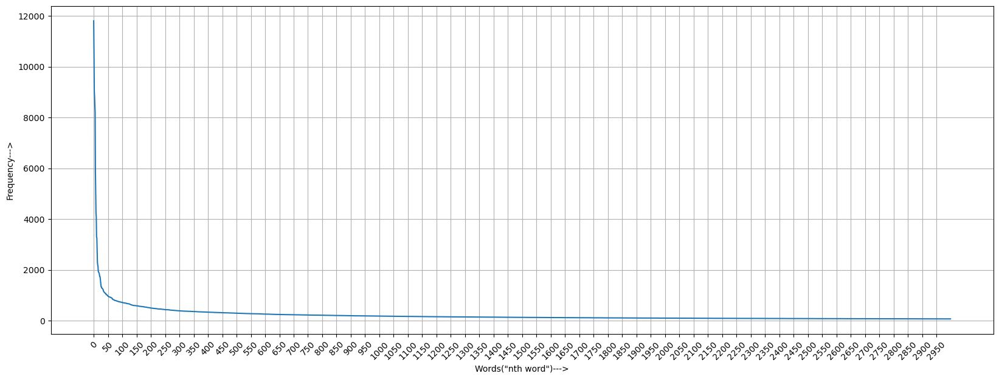

In [18]:
# Plotting graph of word v/s frequency
#This cell draws a frequency distribution graph for us to from where we can carefully observe the frequency trend of out list.
import matplotlib.pyplot as plt
#following are the limits for our graph.
lower_limit=0    #default
upper_limit=3000    #default
difference_between_each_xtick=50  #default value. change these values to observe the graph in more depth
#adjusting size of the graph for more clearity.
plt.figure(figsize=(20, 7))
#plotting
plt.plot(np.arange(len(freq))[lower_limit:upper_limit], freq[lower_limit:upper_limit])
#labelling
plt.xlabel('Words("nth word")--->')
plt.ylabel("Frequency--->")
#adjusting the xticks
plt.xticks(np.arange(lower_limit, upper_limit, 50), rotation=45)
plt.grid()
plt.show()
#observe the following graph by changing the values of lower_limit, upper_limit and difference_between_each_xtick.

In [19]:
#features variable contains all the top words which are most frequently used in all our documents. 

features=np_words[22:len(freq)-1]
print(features)

['NNTP-Posting-Host' 'system' 'world' ... '1-800-EFA-1000' 'neorologist'
 '48090']


In [20]:
# Data modifier function which converts the x_train and x_test into 2D array based on the features

def data_modifier(x_data,features):
    modified_data=np.zeros((len(x_data), len(features)))
    i=0
    for doc in x_data:
        for j in range(len(features)):
            feature=features[i]
            for word in doc:
                if word==feature:
                    modified_data[i][j]=modified_data[i][j]+1
        i=i+1
        print("Document entered in 2D array numbered: ",i)
    return(modified_data)

In [ ]:
x_train_modified=data_modifier(x_train,features)
x_train_modified

In [ ]:
x_test_modified=data_modifier(x_test,features)
9x_test_modified

In [ ]:
# Inbuilt Multinomial Naive Bayes classifier

clf=MultinomialNB()
clf.fit(x_train_modified,y_train)
clf.score(x_test_modified)

In [ ]:
# Building own Multinomial Naive Bayes Classifier

def fit(x_train_modified,y_train,features):
    train_dict={}
    # for i in range(len(x_train_modified)):
    #     x_doc=x_train_modified[i]
    #     y_class=y_train_modified[i]
    #     if y_class not in train_dict.keys():
    #         train_dict[y_class]={}
    #         for
    for i in range(1,21):
        train_dict[i]={}
        for j in range(len(features)):
            train_dict[i][j]=0


        for j in range(len(x_train_modified)):
            if y_train[j]==i:
                x_doc=x_train_modified[j]
                for k in range(len(features)):
                    train_dict[i][k]=train_dict[i][k] + x_doc[k]

    return(train_dict)

# Finding Probability 

def find_probability(x_test,train_dict,y_class):
    feature_dict=train_dict[y_class]
    denominator=0
    no_of_features=0
    prob=0
    
    for key in feature_dict:
        denominator=denominator+feature_dict[key]
        no_of_features=no_of_features+1
        
    denominator=denominator+no_of_features
    
    for feature in class_dict:
        if feature_dict[key]!=0:
            numerator=feature_dict[key]+1
            prob=prob+np.log(numerator/denominator)

    return(prob)
        

# Predicting class for a single document in testing data

def predict_single(x_test,train_dict):
    max_prob=-1
    y_class_predicted=0
    
    for i in range(1,21):
        prob=find_probability(x_test,train_dict,i)
        if prob>max_prob:
            max_prob=prob
            y_class_predicted=i
            
    return(y_class_predicted)
    

# Predicting class function
def predict(x_test,train_dict):
    y_predicted=[]
    
    for i in range(len(x_test)):
        y_class_predicted=predict_single(x_test[i],train_dict)
        y_predicted.append(y_class_predicted)
        
    return(y_predicted)
        



In [ ]:
# fit the training dataset into fit function

train_dict=fit(x_train_modified,y_train,features)

In [ ]:
# list of predicted classes

y_predicted=predict(x_test_modified,train_dict)
print(y_predicted)

In [ ]:
#printing the confusion matrix for our own naive bayes classifier.

from sklearn.metrics import confusion_matrix
for i in confusion_matrix(y_true=y_test, y_pred=y_predicted):
    for j in i:
        print(j, end="    ")
    print()


In [ ]:
#printing the classification report for our own naive bayes classifier.

from sklearn.metrics import classification_report
print(classification_report(y_true=y_test, y_pred=y_predicted))